## Probabilistic Learning on Manifolds (MSA of a 12-story RC frame)

In this example, raw data from MSA of a 12-story RC frame is used as sample input. The interested engineering demand parameters include maximum story drift ratio and peak floor acceleration. The intensity measures for quantifying the ground motion characeteristics include pseudo spectral acceleration $Sa(T_1)$, response spectral shape measture $SaRatio$, and 5-75% significant duration $D_{S5-75}$.

The input sample included 472 data points (from six intensity levels in MSA) and each features an unique vector of intensity measures and engineering demand parameters. The goal is to use PLoM learn the data structure and generate more samples whose key statistics (i.e., mean and covariance) are consistent with the input sample.

### Import python modules

In [1]:
import numpy as np
import random
import time
from math import pi
import pandas as pd
from ctypes import *
%matplotlib notebook
import matplotlib.pyplot as plt
import sys

### Import PLoM modules

In [2]:
sys.path.insert(1, '../../')
from PLoM import *

### Load Multi-Stripe Analysis (MSA) Data
MSA data are loaded via a comma-separate value (csv) file. The first row contains column names for both predictors (X) and responses (y). The following rows are input sample data. Users are expected to specif the csv filename.

2021-09-19 15:45:30.144645  RUNNING-MSG --NEW LOG STARTING FROM THIS LINE-- 
2021-09-19 15:45:30.146303  RUNNING-MSG PLoM: Running directory /home/kuanshi/Documents/PLoM/FullMSA initialized. 
2021-09-19 15:45:30.199368  RUNNING-MSG PLoM: database server initialized. 
2021-09-19 15:45:30.199835  RUNNING-MSG PLoM: visualization folder /home/kuanshi/Documents/PLoM/FullMSA/FigOut initialized. 
2021-09-19 15:45:30.208381  RUNNING-MSG PLoM.load_data: loaded data size = (475, 27). 
2021-09-19 15:45:30.235217  RUNNING-MSG PLoM.initialize_data: current X0 size = (475, 27). 
2021-09-19 15:45:30.235652  RUNNING-MSG PLoM.initialize_data: X0 and X0_size saved to database. 


<IPython.core.display.Javascript object>


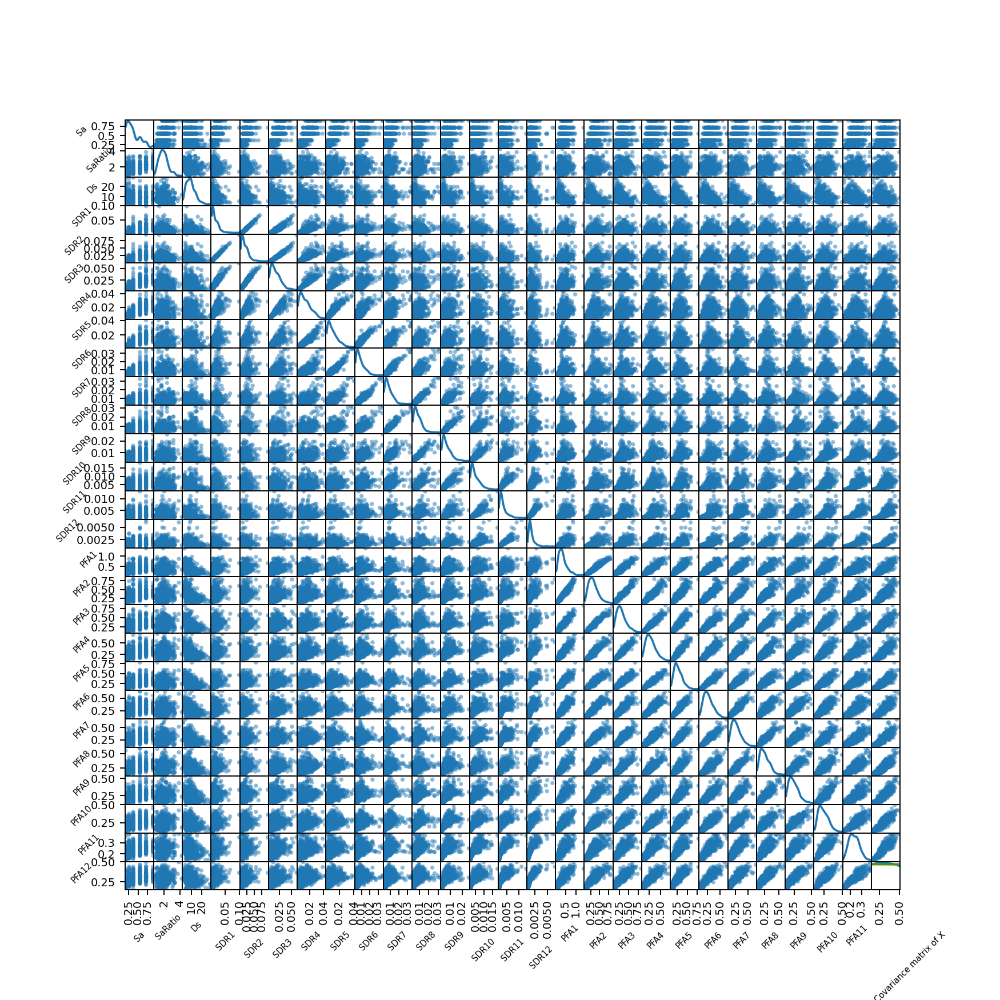

2021-09-19 15:45:50.545768  RUNNING-MSG PLoM: ScatterMatrix_X0.png saved in /home/kuanshi/Documents/PLoM/FullMSA/FigOut. 
2021-09-19 15:45:50.546433  WARNING-MSG PLoM.add_constraints: no user-defined constraint - please use add_constraints(constraints_file=X) to add new constraints if any. 
2021-09-19 15:45:50.546739  RUNNING-MSG PLoM: using RunAlgorithm(n_mc=n_mc,epsilon_pca=epsilon_pca,epsilon_kde) to run simulations. 


In [3]:
# Filename
filename = './data/response_rcf12_msa_la_nc.csv'
model = PLoM(model_name='FullMSA', data=filename, col_header=True, plot_tag=True)

### Configuring tasks
Please specify tasks to run - the list of tasks can be run in sqeunce or invidivdual tasks can be run separately.

In [4]:
tasks = ['DataNormalization','RunPCA','RunKDE','DiffMaps','ISDEGeneration']

### Step 0: Scaling the data

In [5]:
# Configure the task
model.ConfigTasks(['DataNormalization'])
# Launch the run
model.RunAlgorithm()

2021-09-19 15:45:50.658336  RUNNING-MSG PLoM.config_tasks: the following tasks is configured to run: DataNormalization. 
2021-09-19 15:45:50.660799  RUNNING-MSG PLoM.RunAlgorithm: data normalization completed. 
2021-09-19 15:45:50.709447  RUNNING-MSG PLoM.RunAlgorithm: X_range, X_min, X_scaled and X_scaled_mean saved. 
2021-09-19 15:45:50.758684  RUNNING-MSG PLoM.RunAlgorithm: simulation completed with task(s) DataNormalization done. 


### Step 1: Principal Component Analysis (PCA)

2021-09-19 15:45:50.951143  RUNNING-MSG PLoM.config_tasks: the following tasks is configured to run: RunPCA. 
2021-09-19 15:45:50.962094  RUNNING-MSG PLoM.RunPCA: considered number of PCA components = 27 


<IPython.core.display.Javascript object>


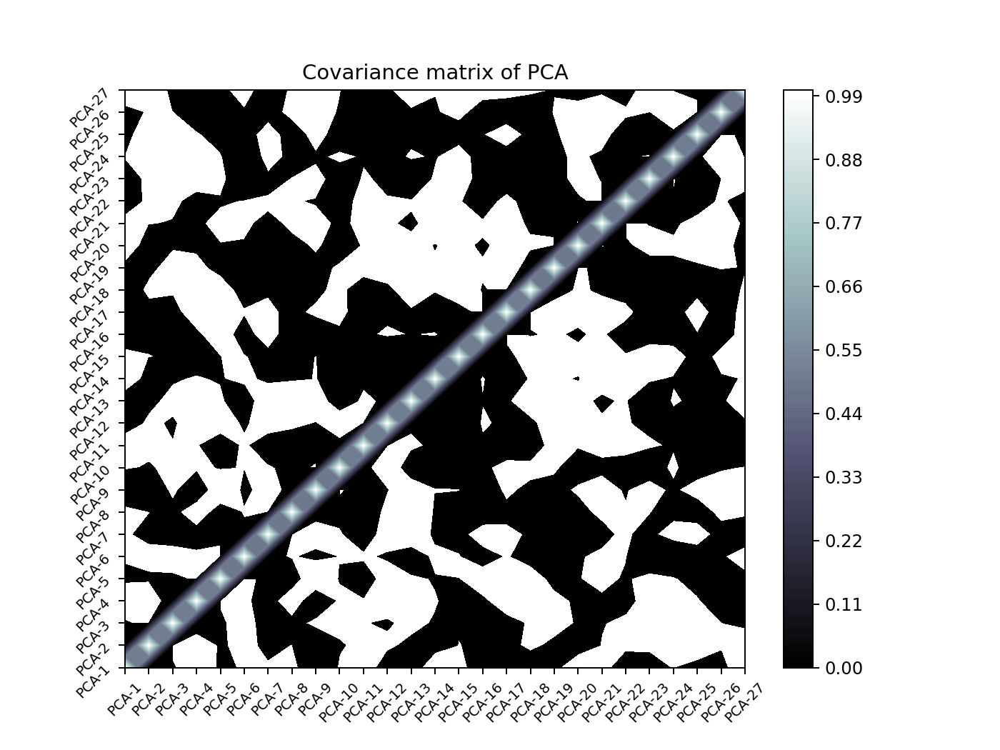

2021-09-19 15:45:52.350398  RUNNING-MSG PLoM: PCA_CovarianceMatrix.png saved in /home/kuanshi/Documents/PLoM/FullMSA/FigOut. 
2021-09-19 15:45:52.350945  RUNNING-MSG PLoM.RunAlgorithm: PCA completed. 
2021-09-19 15:45:52.394695  RUNNING-MSG PLoM.RunAlgorithm: X_PCA, EigenValue_PCA and EigenVector_PCA saved. 
2021-09-19 15:45:52.451480  RUNNING-MSG PLoM.RunAlgorithm: simulation completed with task(s) RunPCA done. 


In [6]:
# Tolerance for truncating principal components
tol_pca = 1e-6
# Configure the task
model.ConfigTasks(['RunPCA'])
# Launch the run
model.RunAlgorithm(epsilon_pca=tol_pca)

### Step 2: Kernel Density Estimation (KDE)

In [7]:
# Smoothing parameter in the KDE
sp = 25
# Configure the task
model.ConfigTasks(['RunKDE'])
# Launch the run
model.RunAlgorithm(epsilon_kde=sp)

2021-09-19 15:45:52.720963  RUNNING-MSG PLoM.config_tasks: the following tasks is configured to run: RunKDE. 
2021-09-19 15:45:53.888205  RUNNING-MSG PLoM.RunAlgorithm: kernel density estimation completed. 
2021-09-19 15:45:53.941133  RUNNING-MSG PLoM.RunAlgorithm: KDE, X_KDE and EigenValues_KDE saved. 
2021-09-19 15:45:54.035723  RUNNING-MSG PLoM.RunAlgorithm: simulation completed with task(s) RunKDE done. 


### Step 3: Diffusion Maps

2021-09-19 15:45:54.406078  RUNNING-MSG PLoM.config_tasks: the following tasks is configured to run: DiffMaps. 


<IPython.core.display.Javascript object>


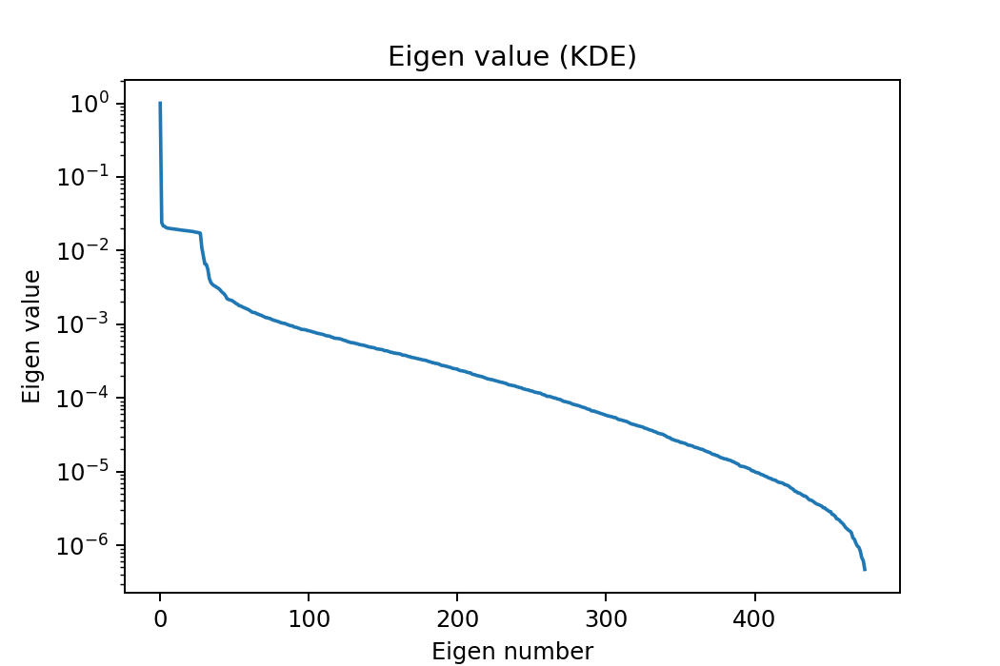

2021-09-19 15:45:54.933336  RUNNING-MSG PLoM: KDE_EigenValue.png saved in /home/kuanshi/Documents/PLoM/FullMSA/FigOut. 
2021-09-19 15:45:54.933844  RUNNING-MSG PLoM.RunAlgorithm: diffusion maps completed. 
2021-09-19 15:45:54.977796  RUNNING-MSG PLoM.RunAlgorithm: DiffMaps_g, DiffMaps_m, DiffMaps_a and DiffMaps_Z saved. 
2021-09-19 15:45:55.070476  RUNNING-MSG PLoM.RunAlgorithm: simulation completed with task(s) DiffMaps done. 


In [8]:
# Configure the task
model.ConfigTasks(['DiffMaps'])
# Launch the run
model.RunAlgorithm()

### Step 4: Create the generator

In [9]:
# Extra parameters for ISDE generation
new_sample_num_ratio = 10
tol_PCA2 = 1e-5
# Configure the task
model.ConfigTasks(['ISDEGeneration'])
# Launch the run
model.RunAlgorithm(n_mc = new_sample_num_ratio, tol_PCA2 = tol_PCA2)

2021-09-19 15:45:55.531689  RUNNING-MSG PLoM.config_tasks: the following tasks is configured to run: ISDEGeneration. 
delta t:  0.1916302934299121
2021-09-19 15:46:05.243988  RUNNING-MSG PLoM.ISDEGeneration: new generations are simulated. 
2021-09-19 15:46:05.262880  RUNNING-MSG PLoM.RunAlgorithm: Realizations generated. 
2021-09-19 15:46:05.280371  RUNNING-MSG PLoM.RunAlgorithm: X_new saved. 
2021-09-19 15:46:05.353908  RUNNING-MSG PLoM.RunAlgorithm: simulation completed with task(s) ISDEGeneration done. 


### Step 5: Exporting data

In [10]:
# Available data list
model.export_results()

2021-09-19 15:46:05.392224  RUNNING-MSG PLoM.export_results: available data /DS_DiffMaps_Z,/DS_DiffMaps_a,/DS_DiffMaps_g,/DS_DiffMaps_m,/DS_EigenValue_PCA,/DS_EigenValues_KDE,/DS_EigenVector_PCA,/DS_Errors,/DS_N,/DS_NumComp_PCA,/DS_X0,/DS_X_KDE,/DS_X_PCA,/DS_X_min,/DS_X_new,/DS_X_range,/DS_X_scaled,/DS_X_scaled_mean,/DS_c_v,/DS_hat_s_v,/DS_n,/DS_s_v,/DiffMaps_Z,/DiffMaps_a,/DiffMaps_g,/DiffMaps_m,/EigenValue_PCA,/EigenValues_KDE,/EigenVector_PCA,/Errors,/N,/NumComp_PCA,/X0,/X_KDE,/X_PCA,/X_min,/X_new,/X_range,/X_scaled,/X_scaled_mean,/basic,/c_v,/constraints_file,/hat_s_v,/n,/s_v. 


In [11]:
# Pick up the original and new realizations, X0 and X_new
model.export_results(data_list=['/X0','/X_new'], file_format_list=['csv','csv'])

2021-09-19 15:46:05.444790  RUNNING-MSG PLoM.export_results: /X0 is exported in /home/kuanshi/Documents/PLoM/FullMSA/DataOut/X0.csv. 
2021-09-19 15:46:05.578690  RUNNING-MSG PLoM.export_results: /X_new is exported in /home/kuanshi/Documents/PLoM/FullMSA/DataOut/X_new.csv. 


### Post-processing
We would like to check the basic statistics of the input sample (i.e., MSA) and the generated new realizations by PLoM. The key metrics include the median, standard deviation, and correlation coefficient matrix of different structural responses.

In [12]:
# Load results
df_msa = pd.read_csv('/home/kuanshi/Documents/PLoM/FullMSA/DataOut/X0.csv')
df_plom = pd.read_csv('/home/kuanshi/Documents/PLoM/FullMSA/DataOut/X_new.csv')
print(df_msa.head)
print(df_plom.head)

<bound method NDFrame.head of      Unnamed: 0     Sa   SaRatio      Ds      SDR1      SDR2      SDR3  \
0             0  0.169  1.171803   9.345  0.004853  0.005062  0.003710   
1             1  0.169  1.003348  12.748  0.005772  0.007791  0.007317   
2             2  0.169  1.400105   8.620  0.006100  0.008452  0.007983   
3             3  0.169  1.374257   5.265  0.010900  0.013080  0.011397   
4             4  0.169  1.898769   8.610  0.004887  0.006293  0.005690   
..          ...    ...       ...     ...       ...       ...       ...   
470         470  0.900  2.367299  19.620  0.026500  0.033000  0.035800   
471         471  0.900  3.068148   6.760  0.019700  0.023600  0.022100   
472         472  0.900  3.459921   8.020  0.023400  0.027600  0.026400   
473         473  0.900  2.580551   2.130  0.028936  0.030451  0.026794   
474         474  0.900  1.931883  10.985  0.023300  0.029600  0.031800   

         SDR4      SDR5      SDR6  ...      PFA3      PFA4      PFA5  \
0    0.00

In [19]:
# Maximum story drift ratio in the building
# Note: the SDR are in the rows # 4 ~ # 15
sa_msa = df_msa['Sa']
sa_plom = df_plom['Sa']
col_list = ['SDR'+str(x+1) for x in range(12)]
sdr_max_msa = np.max(df_msa[col_list], axis=1)
sdr_max_plom = np.max(df_plom[col_list], axis=1)

<IPython.core.display.Javascript object>


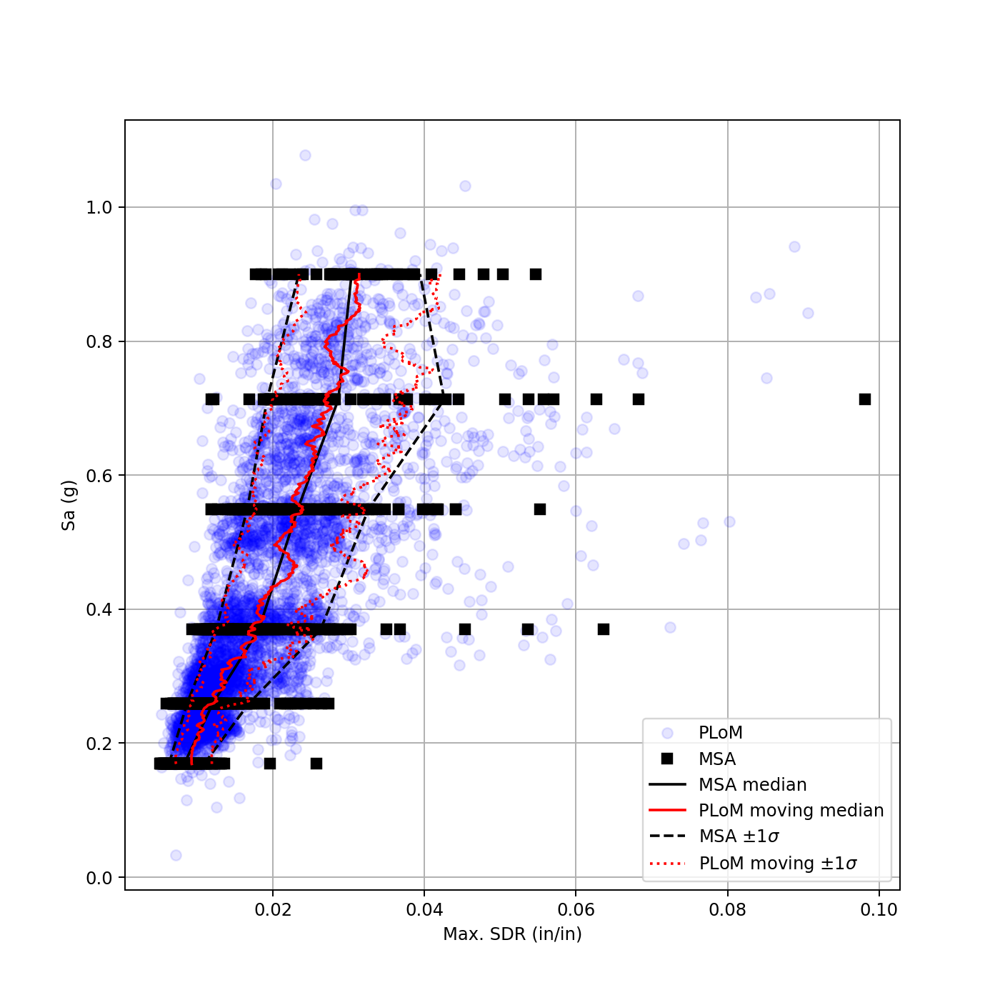

In [44]:
iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
sdr_max_med_msa = [np.exp(np.mean(np.log(sdr_max_msa[df_msa['Sa']==iml_x]))) for iml_x in iml]
sdr_max_std_msa = [np.std(np.log(sdr_max_msa[df_msa['Sa']==iml_x])) for iml_x in iml]

iml2 = np.linspace(np.min(iml),np.max(iml),500)
num_nb = 100
sdr_max_med_plom = [np.exp(np.mean(np.log(sdr_max_plom[abs(np.log(df_plom['Sa'])-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
sdr_max_std_plom = [np.std(np.log(sdr_max_plom[abs(np.log(df_plom['Sa'])-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]

fig, ax = plt.subplots(figsize=(8,8))
ax.plot(sdr_max_plom, sa_plom, 'bo', alpha=0.1, label='PLoM')
ax.plot(sdr_max_msa, sa_msa, 'ks', label='MSA')
ax.plot(sdr_max_med_msa, iml, 'k-', label='MSA median')
ax.plot(sdr_max_med_plom, iml2, 'r-', label='PLoM moving median')
ax.plot(sdr_max_med_msa*np.exp(sdr_max_std_msa), iml, 'k--', label='MSA $\pm$1$\sigma$')
ax.plot(sdr_max_med_plom*np.exp(sdr_max_std_plom), iml2, 'r:', label='PLoM moving $\pm$1$\sigma$')
ax.plot(sdr_max_med_msa/np.exp(sdr_max_std_msa), iml, 'k--')
ax.plot(sdr_max_med_plom/np.exp(sdr_max_std_plom), iml2, 'r:')

ax.set_xlabel('Max. SDR (in/in)')
ax.set_ylabel('Sa (g)')
ax.legend()
ax.grid()
plt.show()

<IPython.core.display.Javascript object>


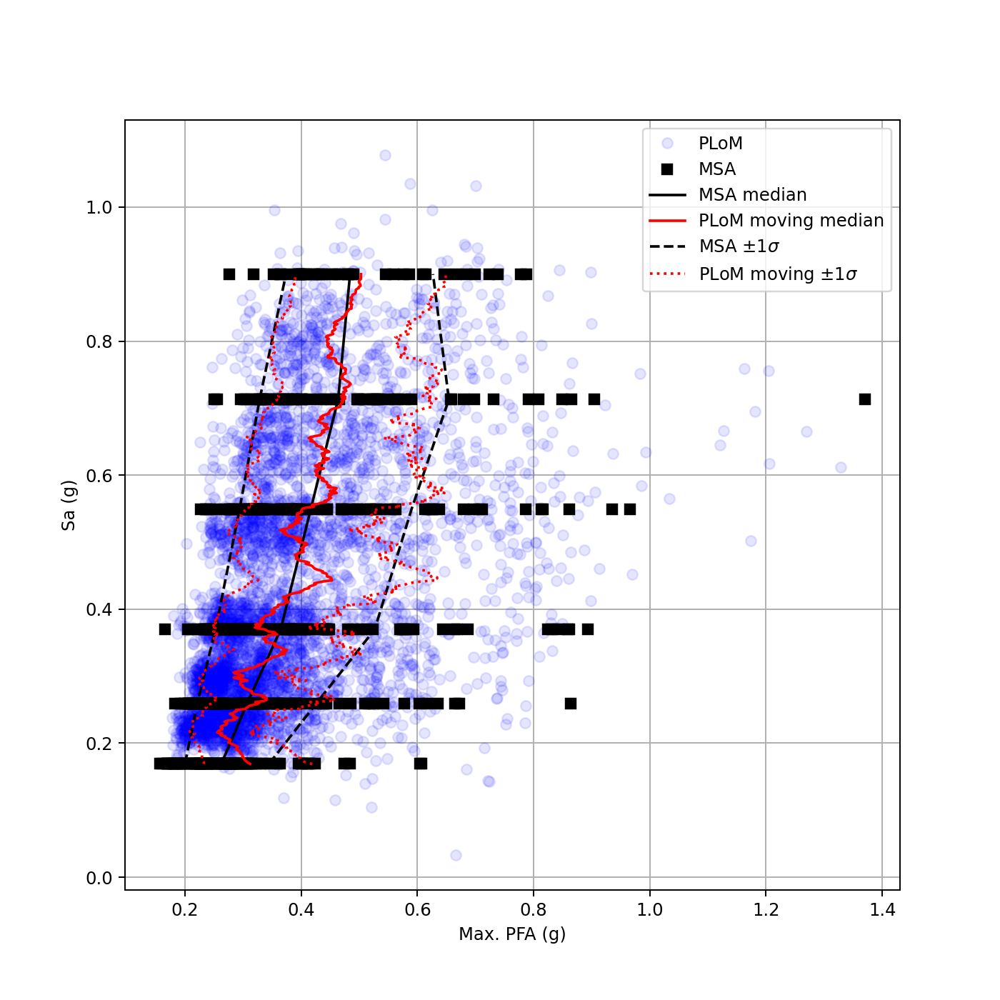

In [52]:
# Peak story acceleration in the building
# Note: the PFA are in the rows # 16 ~ # 27
col_list = ['PFA'+str(x+1) for x in range(12)]
pfa_max_msa = np.max(df_msa[col_list], axis=1)
pfa_max_plom = np.max(df_plom[col_list], axis=1)

iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
pfa_max_med_msa = [np.exp(np.mean(np.log(pfa_max_msa[sa_msa==iml_x]))) for iml_x in iml]
pfa_max_std_msa = [np.std(np.log(pfa_max_msa[sa_msa==iml_x])) for iml_x in iml]

iml2 = np.linspace(np.min(iml),np.max(iml),500)
num_nb = 100
pfa_max_med_plom = [np.exp(np.mean(np.log(pfa_max_plom[abs(np.log(df_plom['Sa'])-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
pfa_max_std_plom = [np.std(np.log(pfa_max_plom[abs(np.log(df_plom['Sa'])-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]

fig, ax = plt.subplots(figsize=(8,8))
ax.plot(pfa_max_plom, sa_plom, 'bo', alpha=0.1, label='PLoM')
ax.plot(pfa_max_msa, sa_msa, 'ks', label='MSA')
ax.plot(pfa_max_med_msa, iml, 'k-', label='MSA median')
ax.plot(pfa_max_med_plom, iml2, 'r-', label='PLoM moving median')
ax.plot(pfa_max_med_msa*np.exp(pfa_max_std_msa), iml, 'k--', label='MSA $\pm$1$\sigma$')
ax.plot(pfa_max_med_plom*np.exp(pfa_max_std_plom), iml2, 'r:', label='PLoM moving $\pm$1$\sigma$')
ax.plot(pfa_max_med_msa/np.exp(pfa_max_std_msa), iml, 'k--')
ax.plot(pfa_max_med_plom/np.exp(pfa_max_std_plom), iml2, 'r:')

ax.set_xlabel('Max. PFA (g)')
ax.set_ylabel('Sa (g)')
ax.legend()
ax.grid()
plt.show()

<IPython.core.display.Javascript object>


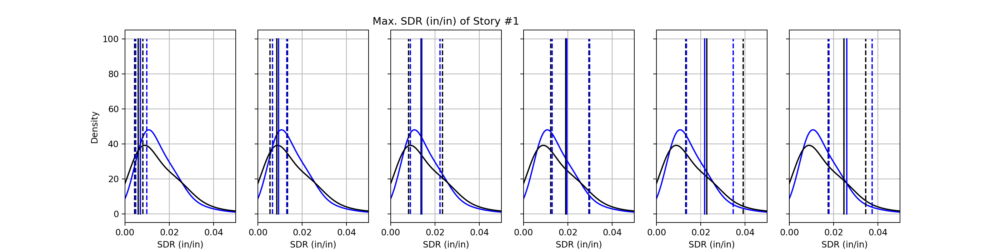

<IPython.core.display.Javascript object>


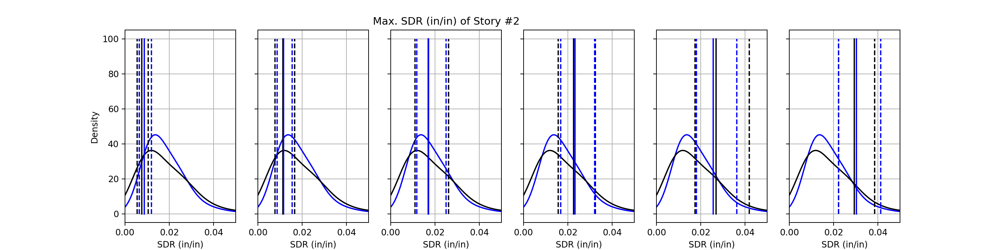

<IPython.core.display.Javascript object>


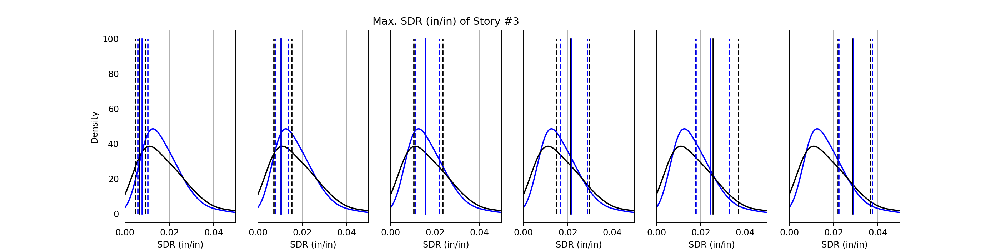

/tmp/ipykernel_3582/2389805574.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,4))


<IPython.core.display.Javascript object>


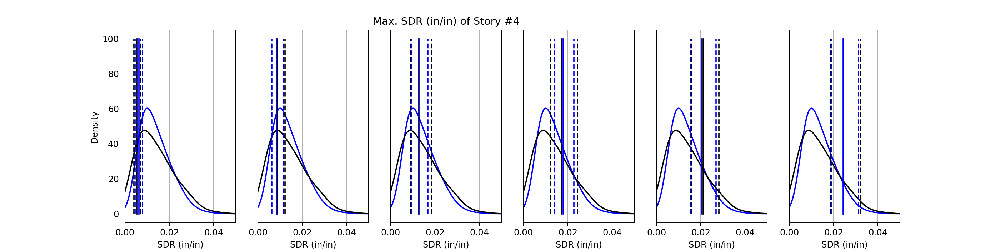

<IPython.core.display.Javascript object>


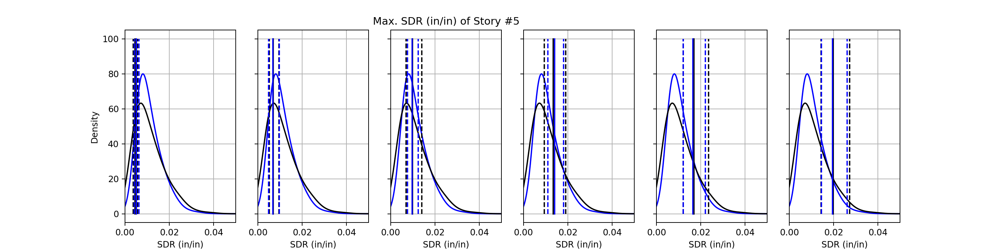

<IPython.core.display.Javascript object>


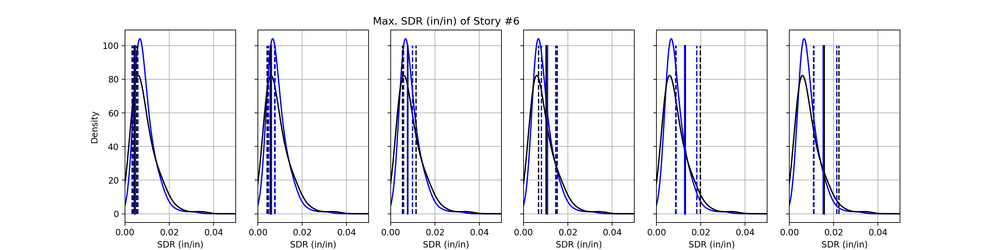

<IPython.core.display.Javascript object>


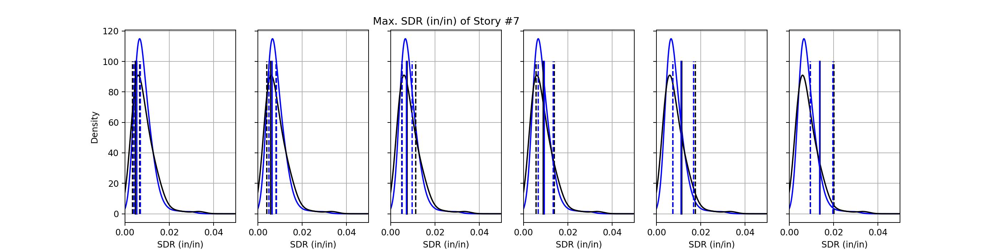

<IPython.core.display.Javascript object>


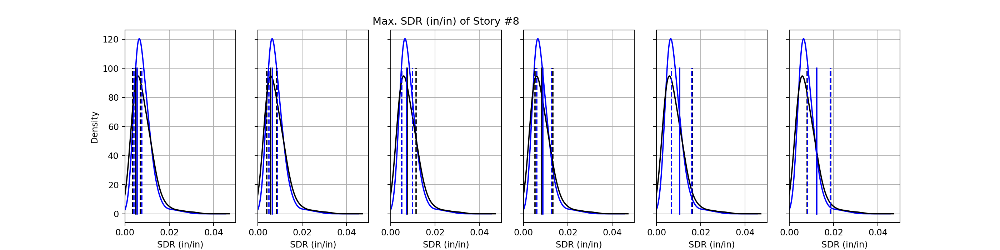

<IPython.core.display.Javascript object>


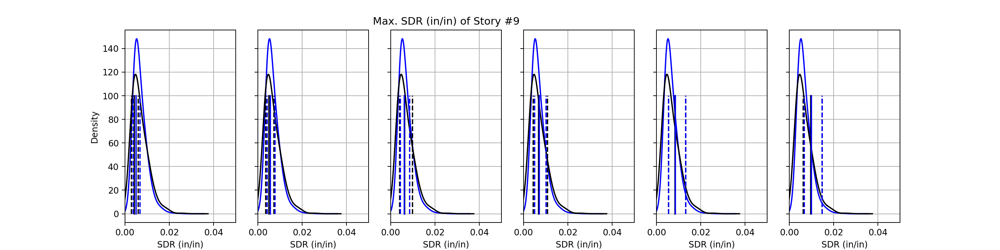

<IPython.core.display.Javascript object>


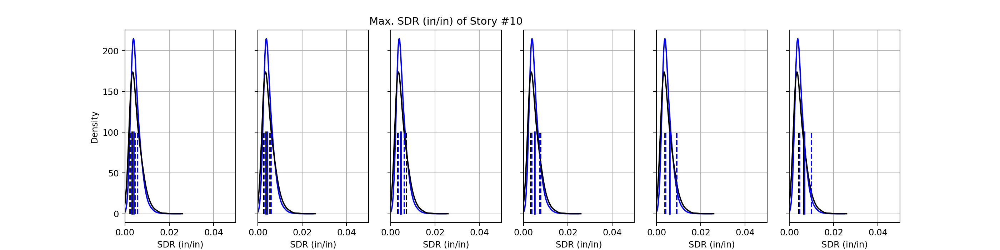

<IPython.core.display.Javascript object>


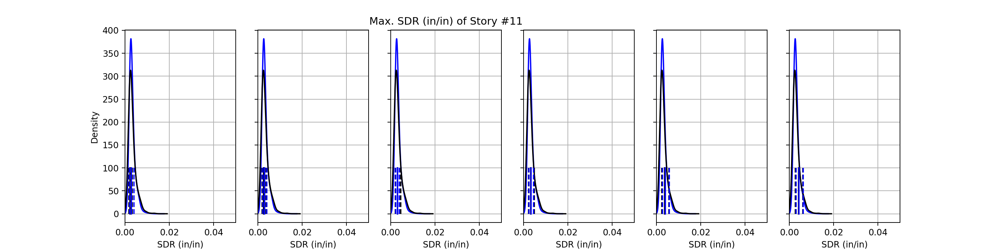

<IPython.core.display.Javascript object>


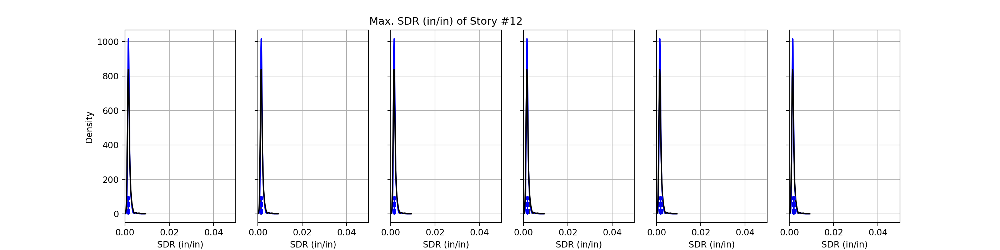

In [79]:
# Story-based responses (SDR)
x0 = df_msa.iloc[:,1:].T
x_c = df_plom.iloc[:,1:].T
sa_msa = x0.iloc[0,:]
sa_plom = x_c.iloc[0,:]
iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
for i in range(12):
    sdr_cur_msa = x0.iloc[i+3,:]
    sdr_cur_plom = x_c.iloc[i+3,:]
    sdr_cur_med_msa = [np.exp(np.mean(np.log(sdr_cur_msa[x0.iloc[0,:]==iml_x]))) for iml_x in iml]
    sdr_cur_std_msa = [np.std(np.log(sdr_cur_msa[x0.iloc[0,:]==iml_x])) for iml_x in iml]

    iml2 = iml
    num_nb = 100
    sdr_cur_med_plom = [np.exp(np.mean(np.log(sdr_cur_plom[abs(np.log(x_c.iloc[0,:])-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
    sdr_cur_std_plom = [np.std(np.log(sdr_cur_plom[abs(np.log(x_c.iloc[0,:])-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]
    
    plt.figure(figsize=(16,4))
    for j in range(6):
        plt.subplot(1,6,j+1)
        ax = plt.gca()
        pd.Series(sdr_cur_plom).plot.kde(color='b', bw_method=0.5)
        pd.Series(sdr_cur_msa).plot.kde(color='k', bw_method=0.5)
        ax.plot([sdr_cur_med_msa[j], sdr_cur_med_msa[j]], [0, 100], 'k-')
        ax.plot([sdr_cur_med_msa[j]*np.exp(sdr_cur_std_msa[j]), sdr_cur_med_msa[j]*np.exp(sdr_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([sdr_cur_med_msa[j]/np.exp(sdr_cur_std_msa[j]), sdr_cur_med_msa[j]/np.exp(sdr_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([sdr_cur_med_plom[j], sdr_cur_med_plom[j]], [0, 100], 'b-')
        ax.plot([sdr_cur_med_plom[j]*np.exp(sdr_cur_std_plom[j]), sdr_cur_med_plom[j]*np.exp(sdr_cur_std_plom[j])], [0, 100], 'b--')
        ax.plot([sdr_cur_med_plom[j]/np.exp(sdr_cur_std_plom[j]), sdr_cur_med_plom[j]/np.exp(sdr_cur_std_plom[j])], [0, 100], 'b--')
        ax.set_xlim(0.0, 0.05)
        #ax.set_ylim(0.0, 200)
        ax.grid()
        ax.set_xlabel('SDR (in/in)')
        if j > 0:
            ax.set_yticklabels('')
            ax.set_ylabel('')
        if j == 2:
            ax.set_title('Max. SDR (in/in) of Story #'+str(i+1))

<IPython.core.display.Javascript object>


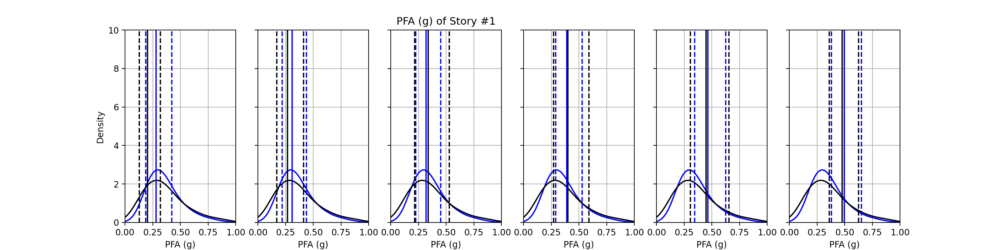

<IPython.core.display.Javascript object>


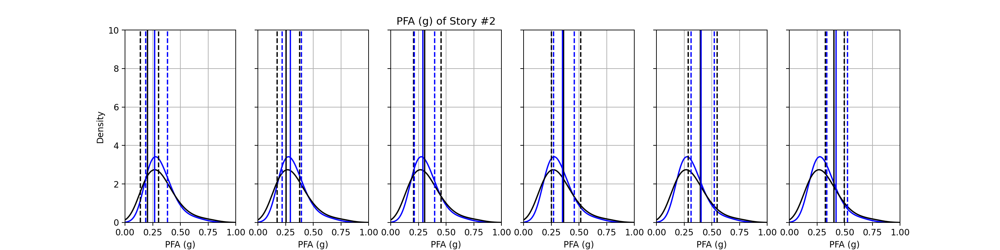

<IPython.core.display.Javascript object>


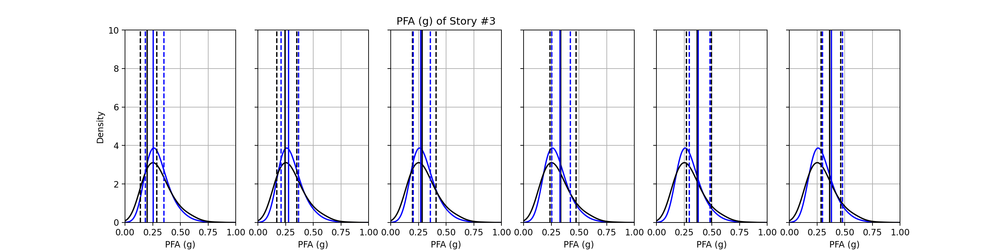

<IPython.core.display.Javascript object>


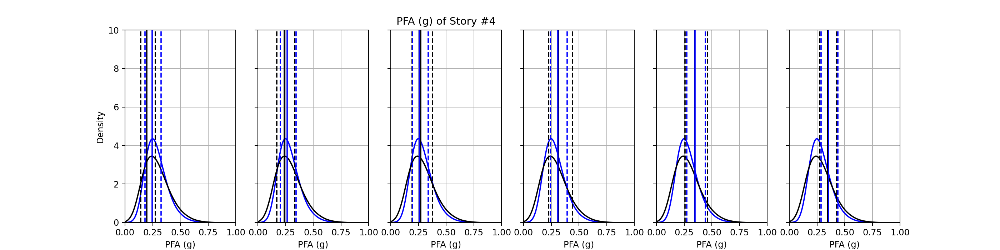

<IPython.core.display.Javascript object>


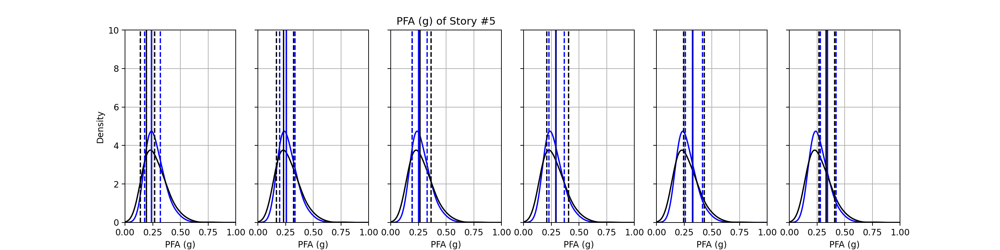

<IPython.core.display.Javascript object>


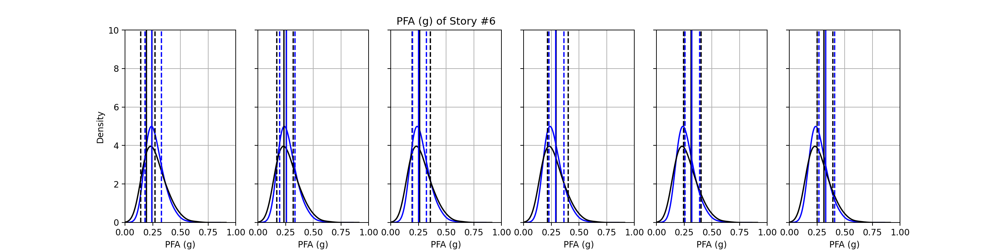

<IPython.core.display.Javascript object>


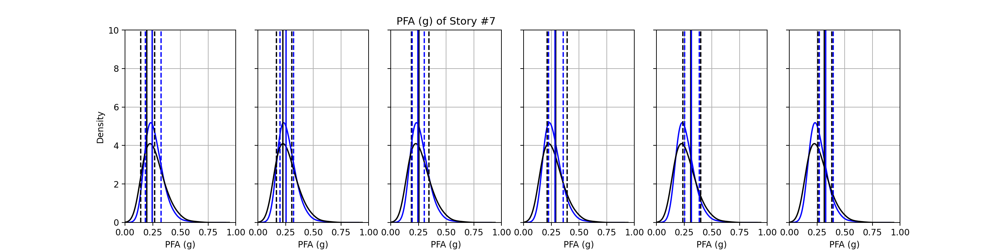

<IPython.core.display.Javascript object>


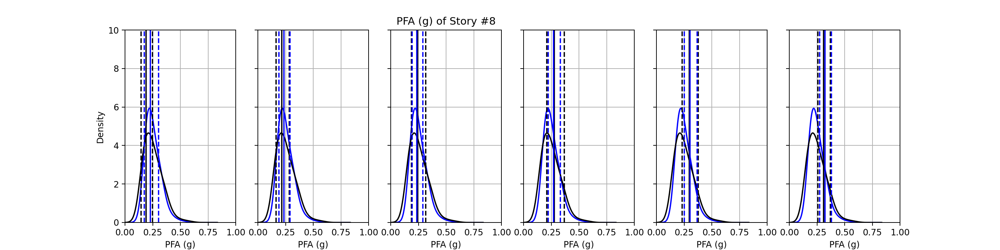

<IPython.core.display.Javascript object>


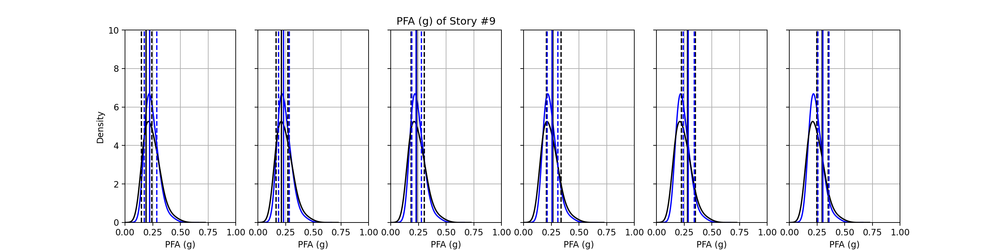

<IPython.core.display.Javascript object>


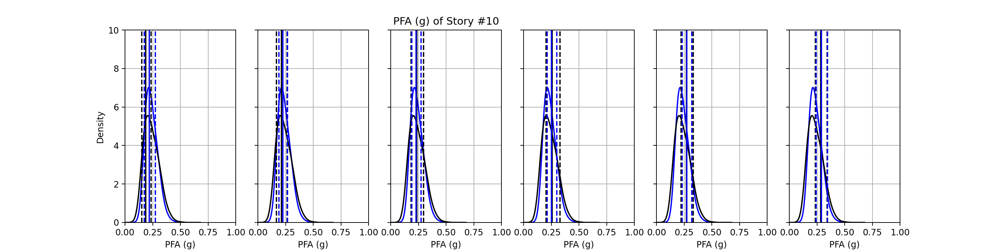

<IPython.core.display.Javascript object>


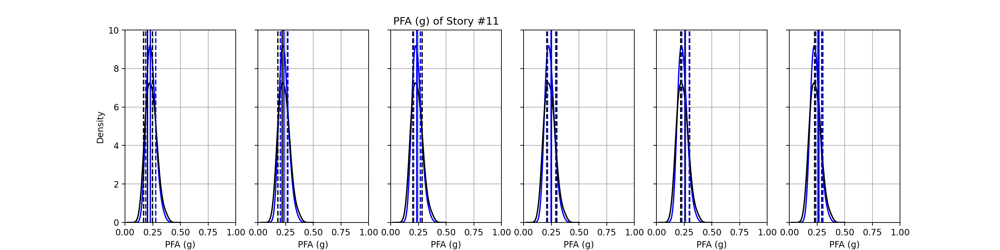

<IPython.core.display.Javascript object>


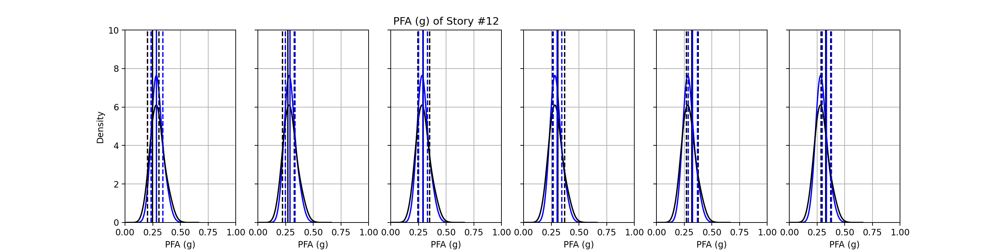

In [81]:
# Story-based responses (PFA)
iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
for i in range(12):
    pfa_cur_msa = x0.iloc[i+15,:]
    pfa_cur_plom = x_c.iloc[i+15,:]
    pfa_cur_med_msa = [np.exp(np.mean(np.log(pfa_cur_msa[x0.iloc[0,:]==iml_x]))) for iml_x in iml]
    pfa_cur_std_msa = [np.std(np.log(pfa_cur_msa[x0.iloc[0,:]==iml_x])) for iml_x in iml]

    iml2 = iml
    num_nb = 100
    pfa_cur_med_plom = [np.exp(np.mean(np.log(pfa_cur_plom[abs(np.log(x_c.iloc[0,:])-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
    pfa_cur_std_plom = [np.std(np.log(pfa_cur_plom[abs(np.log(x_c.iloc[0,:])-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]
    
    plt.figure(figsize=(16,4))
    for j in range(6):
        plt.subplot(1,6,j+1)
        ax = plt.gca()
        pd.Series(pfa_cur_plom).plot.kde(color='b', bw_method=0.5)
        pd.Series(pfa_cur_msa).plot.kde(color='k', bw_method=0.5)
        ax.plot([pfa_cur_med_msa[j], pfa_cur_med_msa[j]], [0, 100], 'k-')
        ax.plot([pfa_cur_med_msa[j]*np.exp(pfa_cur_std_msa[j]), pfa_cur_med_msa[j]*np.exp(pfa_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([pfa_cur_med_msa[j]/np.exp(pfa_cur_std_msa[j]), pfa_cur_med_msa[j]/np.exp(pfa_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([pfa_cur_med_plom[j], pfa_cur_med_plom[j]], [0, 100], 'b-')
        ax.plot([pfa_cur_med_plom[j]*np.exp(pfa_cur_std_plom[j]), pfa_cur_med_plom[j]*np.exp(pfa_cur_std_plom[j])], [0, 100], 'b--')
        ax.plot([pfa_cur_med_plom[j]/np.exp(pfa_cur_std_plom[j]), pfa_cur_med_plom[j]/np.exp(pfa_cur_std_plom[j])], [0, 100], 'b--')
        ax.set_xlim(0.0, 1)
        ax.set_ylim(0.0, 10)
        ax.grid()
        ax.set_xlabel('PFA (g)')
        if j > 0:
            ax.set_yticklabels('')
            ax.set_ylabel('')
        if j == 2:
            ax.set_title('PFA (g) of Story #'+str(i+1))

<IPython.core.display.Javascript object>


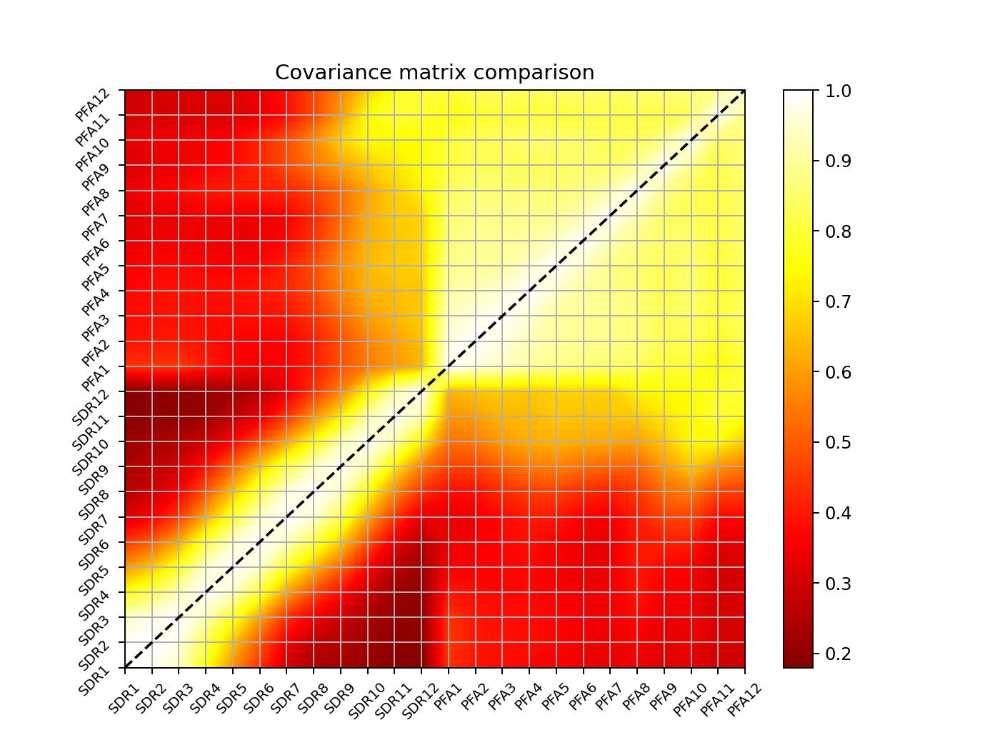

<IPython.core.display.Javascript object>


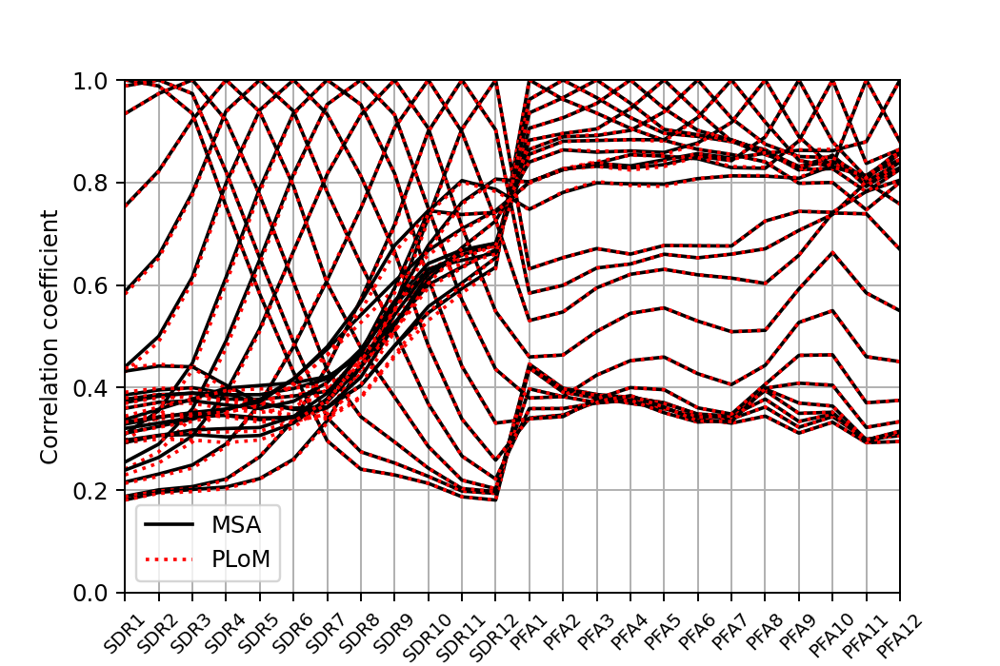

In [89]:
# Correlation coefficient matrix
c_msa = np.corrcoef(x0)
c_plom = np.corrcoef(x_c)
c_combine = c_msa
tmp = np.triu(c_plom).flatten()
tmp = tmp[tmp != 0]
c_combine[np.triu_indices(27)] = tmp

# Plot covariance matrix
fig, ax = plt.subplots(figsize=(8,6))
ctp = ax.contourf(c_combine[3:,3:], cmap=plt.cm.hot, levels=1000)
ctp.set_clim(0,1)
ax.plot([0, 23], [0, 23], 'k--')
ax.set_xticks(list(range(24)))
ax.set_yticks(list(range(24)))
ax.set_xticklabels(x0.index.tolist()[3:], fontsize=8, rotation=45)
ax.set_yticklabels(x0.index.tolist()[3:], fontsize=8, rotation=45)
ax.set_title('Covariance matrix comparison')
ax.grid()
cbar = fig.colorbar(ctp,ticks=[x/10 for x in range(11)])
plt.show()

# Plot the cross-section of correlation matrix
fig, ax = plt.subplots(figsize=(6,4))
ax.plot([0],[0],'k-',label='MSA')
ax.plot([0],[0],'r:',label='PLoM')
for i in range(24):
    ax.plot(np.array(range(24)),c_msa[i+3][3:],'k-')
    ax.plot(np.array(range(24)),c_plom[i+3][3:],'r:')
ax.set_xticks(list(range(24)))
ax.set_xticklabels(x0.index.tolist()[3:], fontsize=8, rotation=45)
ax.set_ylabel('Correlation coefficient')
ax.set_ylim([0,1])
ax.set_xlim([0,23])
ax.legend()
ax.grid()
plt.show()